> Purpose

Produce graphics that show audience about the tropical cyclones (TC) risk for PH. With a focus on TC induced rainfall, rapid intensification, storm surge, and the change in future climate.

> Data source

Track:

IBTRACS

https://www.ncei.noaa.gov/data/international-best-track-archive-for-climate-stewardship-ibtracs/v04r01/access/shapefile/IBTrACS.WP.list.v04r01.lines.zip

https://www.ncei.noaa.gov/data/international-best-track-archive-for-climate-stewardship-ibtracs/v04r01/access/shapefile/IBTrACS.WP.list.v04r01.points.zip

Rainfall:  

IMERG. https://developers.google.com/earth-engine/datasets/catalog/NASA_GPM_L3_IMERG_V07 (Using band "precipitation".)



# **TC-induced rainfall trend: using IMERG**
3a. Save the total rainfall within target area during each event period.

3b. Get the time series of event total rainfall of all TCs that impacted PH in history.

# **Step 0: Imaport and install library**

In [5]:
!pip install cartopy

In [6]:
!pip install rasterio


In [7]:
import geopandas as gpd
import xarray as xr
import ee
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from datetime import datetime, timedelta
from pathlib import Path
import rasterio
from rasterio.plot import show
from rasterio.mask import mask
import geemap
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from shapely.geometry import mapping
from google.colab import files
import warnings
warnings.filterwarnings("ignore")

# **Step 1: Initialize Google Earth Engine**

In [8]:
ee.Authenticate()
ee.Initialize(project='valued-mediator-463106-q8')

# **Step 2: Define paths and constants**

In [9]:
DATA_DIR = Path("data")
IBTRACS_LINES = "IBTrACS.WP.list.v04r01.lines.shp"
IBTRACS_POINTS = "IBTrACS.WP.list.v04r01.points.shp"
PH_BUFFER_SHAPEFILE = "PHL_1degree_buffer.shp"
PH_LAND_SHAPEFILE = "PHL_adm0.shp"
OUTPUT_DIR = Path("output")
OUTPUT_DIR.mkdir(exist_ok=True)
START_YEAR = 2000
END_YEAR = 2025

# **Step 3: Load Philippines 1-degree buffer shapefile**

In [10]:
def load_ph_shapefile():
    """Load Philippines 1-degree buffer shapefile."""
    return gpd.read_file(PH_BUFFER_SHAPEFILE)


# **Step 4: Load Philippines land-only shapefile**

In [11]:
def load_ph_land_shapefile():
    """Load Philippines land-only shapefile."""
    return gpd.read_file(PH_LAND_SHAPEFILE).to_crs(epsg=4326)


# **Step 5: Load IBTrACS shapefiles and filter for Philippines and 2000-2025**

In [12]:
def load_ibtracs(ph_shp):
    lines = gpd.read_file(IBTRACS_LINES)
    points = gpd.read_file(IBTRACS_POINTS)

    # Convert ISO_TIME to datetime
    points["ISO_TIME"] = pd.to_datetime(points["ISO_TIME"])

    # Filter for 2024-2025
    points = points[(points["ISO_TIME"].dt.year >= START_YEAR) &
                    (points["ISO_TIME"].dt.year <= END_YEAR)]

    # Filter for Philippines using shapefile
    ph_lines = lines[lines.intersects(ph_shp.unary_union)]
    ph_points = points[points.intersects(ph_shp.unary_union)]

    return ph_lines, ph_points


# **Step 6: Group points by storm ID and get event periods**

In [13]:
def get_tc_events(points):
    events = []
    for sid in points["SID"].unique():
        storm_points = points[points["SID"] == sid]
        start_time = storm_points["ISO_TIME"].min()
        end_time = storm_points["ISO_TIME"].max()
        events.append({
            "SID": sid,
            "NAME": storm_points["NAME"].iloc[0],
            "START_TIME": start_time,
            "END_TIME": end_time
        })
    return pd.DataFrame(events)



# **Step 7: Fetch IMERG precipitation for a TC event period**

In [14]:
def get_imerg_rainfall(start_time, end_time):
    imerg = ee.ImageCollection("NASA/GPM_L3/IMERG_V07").filterDate(
        start_time.strftime("%Y-%m-%d"),
        (end_time + timedelta(days=1)).strftime("%Y-%m-%d")
    ).select("precipitation")

    # Sum precipitation over the period (mm/hr to total mm)
    total_rain = imerg.sum().multiply(0.5)  # 30-min intervals to hourly
    return total_rain


# **Step 8: Clip IMERG image to Philippines shapefile**

In [15]:
def clip_to_philippines(image, ph_shp_ee):
    return image.clip(ph_shp_ee)


# **Step 9: Export rainfall distribution map with TC route, Philippines boundary, and custom colormap**

In [16]:
def export_rainfall_map(rainfall, sid, name, output_path, ph_shp_ee, ph_shp, ph_land, lines):
    # Export rainfall to temporary GeoTIFF
    temp_tif = output_path / f"temp_{sid}.tif"
    geemap.ee_export_image(rainfall, filename=str(temp_tif),
                           region=ph_shp_ee, scale=11132)

    # Mask rainfall to land-only areas
    with rasterio.open(temp_tif) as src:
        ph_land_geom = [mapping(geom) for geom in ph_land.geometry]
        masked_rainfall, masked_transform = mask(src, ph_land_geom, crop=True, nodata=np.nan)

    # Calculate total rainfall over land (sum of pixel values)
    total_rainfall_mm = np.nansum(masked_rainfall)  # Sum of rainfall in mm

    # Get TC route for this SID
    tc_route = lines[lines["SID"] == sid]

    # Define custom colormap
    colors = [
        "#FFFFFF",         # 0 mm
        "#00CED1",       # 1-10 mm
        "#3a5f3a",       # 10-20 mm
        "#73be73",        # 20-30 mm
        "#90ee90",       # 30-40 mm
        "#FF4500",        # 40-50 mm
        "#F0A040",            # 50-70 mm
        "#D07040",        # 70-100 mm
        "#A05050",       # 100-140 mm
        "#803080",    # 140-200 mm
        "#A040A0",          # 200-300 mm
        "#C080C0",      # 300-400 mm
        "#D0A0D0",          # 400-500 mm
        "#E0C0E0",       # 500-600 mm
        "#F0E0F0"        # >600 mm
    ]
    bounds = [0, 1, 10, 20, 30, 40, 50, 70, 100, 140, 200, 300, 400, 500, 600, 1000]
    color_names = [ #ignore this
        "White", "Light blue", "Green", "Light green", "Lighter green", "Yellow",
        "Orange", "Light red", "Dark red", "Dark purple", "Light purple",
        "Dark pink", "Light pink", "Light violet", "Dark violet"
    ]
    labels = [f"{int(bounds[i])}–{int(bounds[i+1])} mm" if i < len(bounds)-2
              else f">600 mm" if i == len(bounds)-2
              else "" for i in range(len(bounds)-1)]
    cmap = mcolors.ListedColormap(colors)
    norm = mcolors.BoundaryNorm(bounds, cmap.N)

    # Create map using Cartopy
    fig = plt.figure(figsize=(20, 10))
    ax = plt.axes(projection=ccrs.PlateCarree())

    # Set extent to Philippines buffer
    bounds_shp = ph_shp.total_bounds  # [minx, miny, maxx, maxy]
    ax.set_extent([bounds_shp[0], bounds_shp[2], bounds_shp[1], bounds_shp[3]], crs=ccrs.PlateCarree())

    # Plot masked rainfall
    rainfall_img = ax.imshow(masked_rainfall[0], origin="upper", transform=ccrs.PlateCarree(),
                             extent=[masked_transform[2], masked_transform[2] + masked_rainfall.shape[2] * masked_transform[0],
                                     masked_transform[5] + masked_rainfall.shape[1] * masked_transform[4], masked_transform[5]],
                             cmap=cmap, norm=norm)

    # Add custom colorbar
    cbar = plt.colorbar(rainfall_img, ax=ax, label="Rainfall", shrink=0.6, ticks=[(bounds[i] + bounds[i+1])/2 for i in range(len(bounds)-1)])
    cbar.ax.set_yticklabels(labels, rotation=45, ha="right", va="center", fontsize=8)
    cbar.set_label("Rainfall", fontsize=10)

    # Plot Philippines boundary
    ph_shp.plot(ax=ax, edgecolor="black", facecolor="none", linewidth=1.5, transform=ccrs.PlateCarree())

    # Plot TC route
    if not tc_route.empty:
        tc_route.plot(ax=ax, color="red", linewidth=2, transform=ccrs.PlateCarree())

    # Add coastlines and gridlines
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
    ax.gridlines(draw_labels=True, linestyle="--", alpha=0.5)

    # Set title
    ax.set_title(f"TC {name} ({sid}) Rainfall (mm)")

    # Save and download the map
    map_filename = output_path / f"rainfall_map_{sid}.png"
    plt.savefig(map_filename, dpi=300, bbox_inches="tight")
    # files.download(map_filename)
    plt.close()
    temp_tif.unlink()

    return total_rainfall_mm


# **Step 10:Calculate maximum rainfall over Philippines for an event**

In [17]:
def calculate_max_rainfall(rainfall, ph_shp_ee):
    stats = rainfall.reduceRegion(
        reducer=ee.Reducer.max(), geometry=ph_shp_ee, scale=11132
    ).getInfo()
    return stats.get("precipitation", 0)


# **Step 11: Main Function**

below function need 20 mins to run all the tc, so wait and dont panic

Also, it will download the map automactically so please check you have enough space to contain all 360+ tc map

Loading Philippines shapefiles...
Loading IBTrACS data...
Identifying TC events...
Processing TC LONGWANG (2000138N16119)...
Generating rainfall map and calculating total rainfall for 2000138N16119...
Generating URL ...
Please wait ...
Data downloaded to /content/output/temp_2000138N16119.tif
Processing TC UNNAMED (2000141N18116)...
Generating rainfall map and calculating total rainfall for 2000141N18116...
Generating URL ...
Please wait ...
Data downloaded to /content/output/temp_2000141N18116.tif
Processing TC KAI-TAK (2000185N15117)...
Generating rainfall map and calculating total rainfall for 2000185N15117...
Generating URL ...
Please wait ...
Data downloaded to /content/output/temp_2000185N15117.tif
Processing TC UNNAMED (2000193N10131)...
Generating rainfall map and calculating total rainfall for 2000193N10131...
Generating URL ...
Please wait ...
Data downloaded to /content/output/temp_2000193N10131.tif
Processing TC UNNAMED (2000196N16122)...
Generating rainfall map and calcula

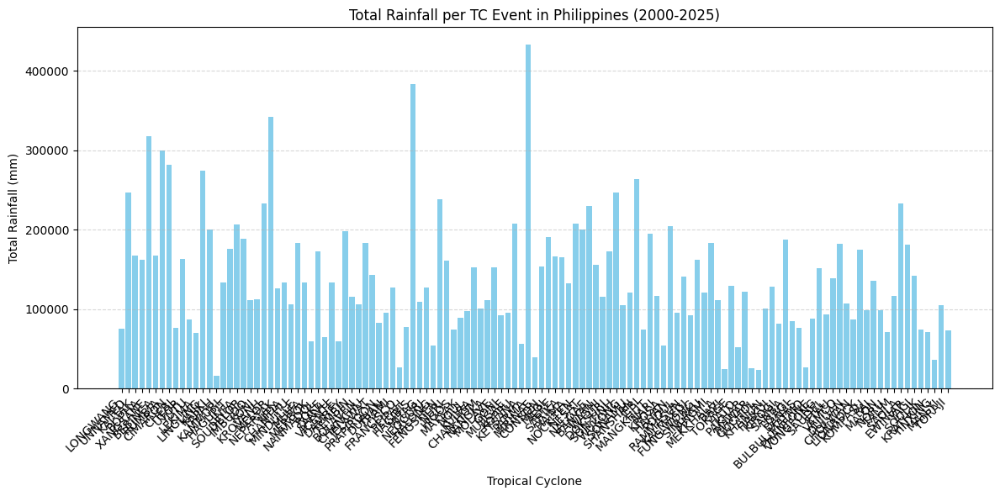

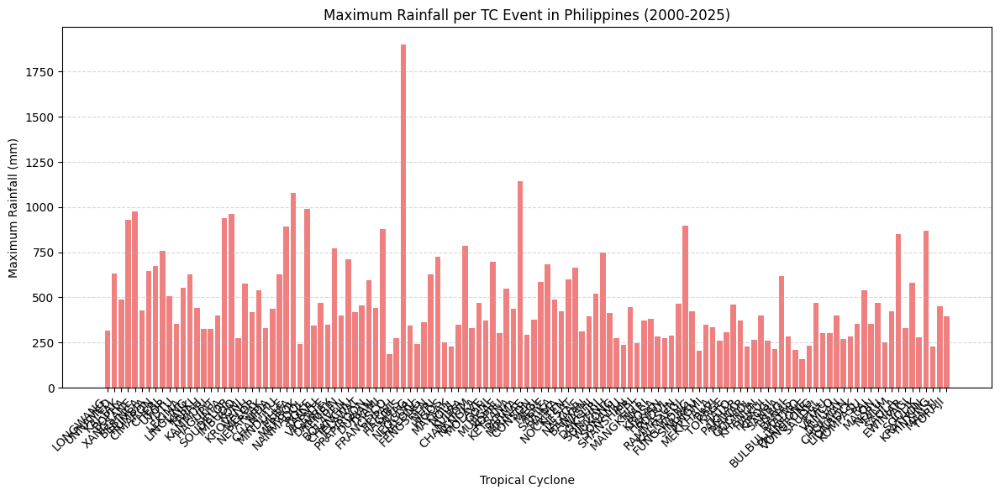

Analysis complete. Outputs saved in: output


In [18]:
def main():
    # Load Philippines shapefiles
    print("Loading Philippines shapefiles...")
    ph_shp = load_ph_shapefile()
    ph_land = load_ph_land_shapefile()

    # Convert buffer shapefile to EE geometry
    ph_coords = ph_shp.geometry.unary_union.__geo_interface__["coordinates"]
    ph_shp_ee = ee.Geometry.Polygon(ph_coords)

    # Load IBTrACS data
    print("Loading IBTrACS data...")
    ph_lines, ph_points = load_ibtracs(ph_shp)

    # Get TC events
    print("Identifying TC events...")
    events = get_tc_events(ph_points)

    # Initialize results for time series (3b) and maximum rainfall (3a)
    total_rainfall_series = []
    max_rainfall_series = []


    # Process each TC event
    for _, event in events.iterrows():
        sid = event["SID"]
        name = event["NAME"]
        start_time = event["START_TIME"]
        end_time = event["END_TIME"]
        print(f"Processing TC {name} ({sid})...")

        # Get IMERG rainfall
        rainfall = get_imerg_rainfall(start_time, end_time)
        rainfall = clip_to_philippines(rainfall, ph_shp_ee)

        print(f"Generating rainfall map and calculating total rainfall for {sid}...")
        total_rainfall_mm = export_rainfall_map(rainfall, sid, name, OUTPUT_DIR, ph_shp_ee, ph_shp, ph_land, ph_lines)
        total_rainfall_series.append({
            "SID": sid,
            "NAME": name,
            "START_TIME": start_time,
            "TOTAL_RAINFALL_MM": total_rainfall_mm
        })

        max_rainfall_mm = calculate_max_rainfall(rainfall, ph_shp_ee)
        max_rainfall_series.append({
            "SID": sid,
            "NAME": name,
            "START_TIME": start_time,
            "MAX_RAINFALL_MM": max_rainfall_mm
        })

    total_rainfall_df = pd.DataFrame(total_rainfall_series)
    total_rainfall_df.to_csv(OUTPUT_DIR / "tc_event_total_rainfall.csv", index=False)

    plt.figure(figsize=(12, 6))
    plt.bar(total_rainfall_df["NAME"], total_rainfall_df["TOTAL_RAINFALL_MM"], color="skyblue")
    plt.title("Total Rainfall per TC Event in Philippines (2000-2025)")
    plt.xlabel("Tropical Cyclone")
    plt.ylabel("Total Rainfall (mm)")
    plt.xticks(rotation=45, ha="right")
    plt.grid(True, axis="y", linestyle="--", alpha=0.5)
    plt.tight_layout()
    plt.show()
    plt.savefig(OUTPUT_DIR / "tc_event_total_rainfall.png", dpi=300)
    plt.close()

    max_rainfall_df = pd.DataFrame(max_rainfall_series)
    max_rainfall_df.to_csv(OUTPUT_DIR / "tc_rainfall_max_time_series.csv", index=False)

    plt.figure(figsize=(12, 6))
    plt.bar(max_rainfall_df["NAME"], max_rainfall_df["MAX_RAINFALL_MM"], color="lightcoral")
    plt.title("Maximum Rainfall per TC Event in Philippines (2000-2025)")
    plt.xlabel("Tropical Cyclone")
    plt.ylabel("Maximum Rainfall (mm)")
    plt.xticks(rotation=45, ha="right")
    plt.grid(True, axis="y", linestyle="--", alpha=0.5)
    plt.tight_layout()
    plt.show()
    plt.savefig(OUTPUT_DIR / "tc_rainfall_max_time_series.png", dpi=300)
    plt.close()

    print("Analysis complete. Outputs saved in:", OUTPUT_DIR)


if __name__ == "__main__":
    main()

# **Result: Total Rainfall per TC Event in Philippines from 2000 to 2025**





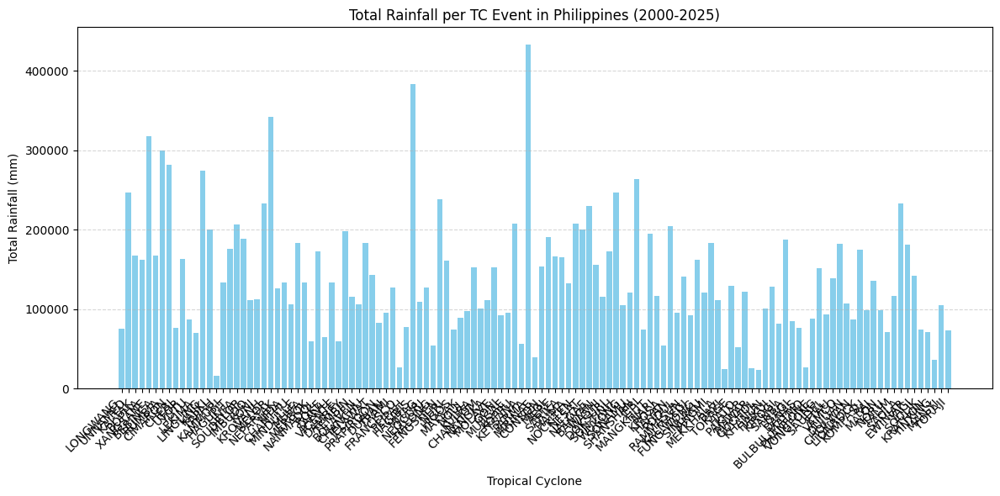

Highest total Rainfall caused by TC in Philippines: 2009270N10148 PARMA 433447mm

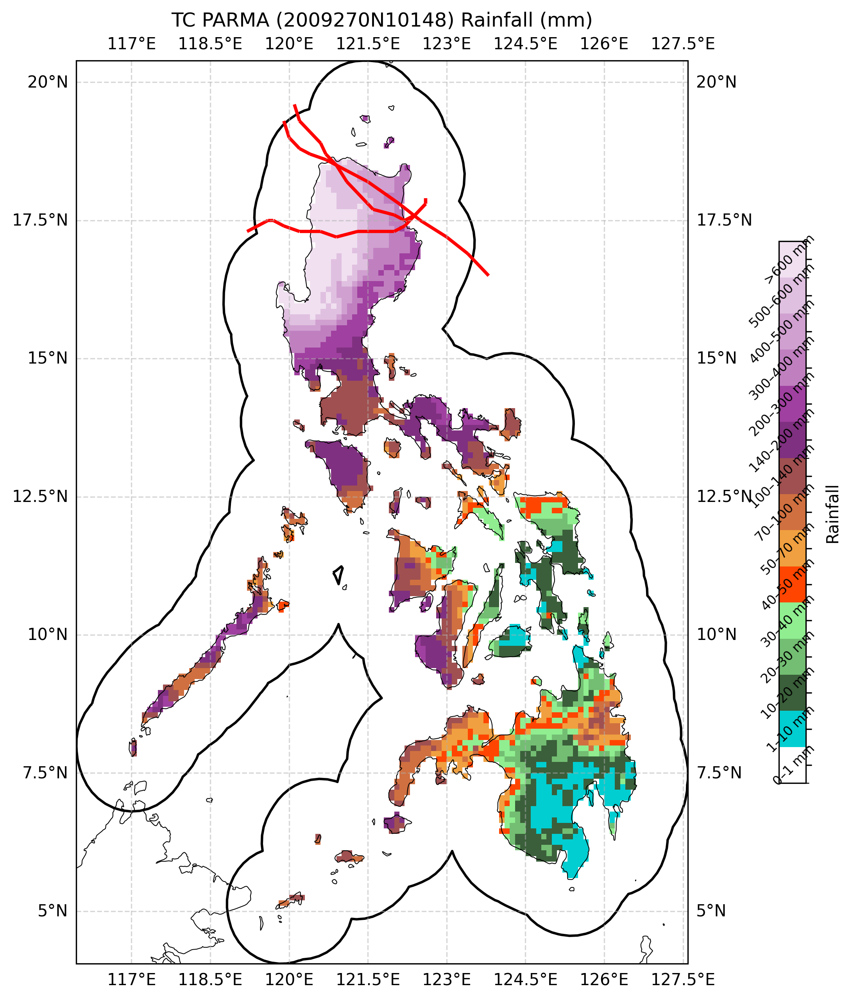

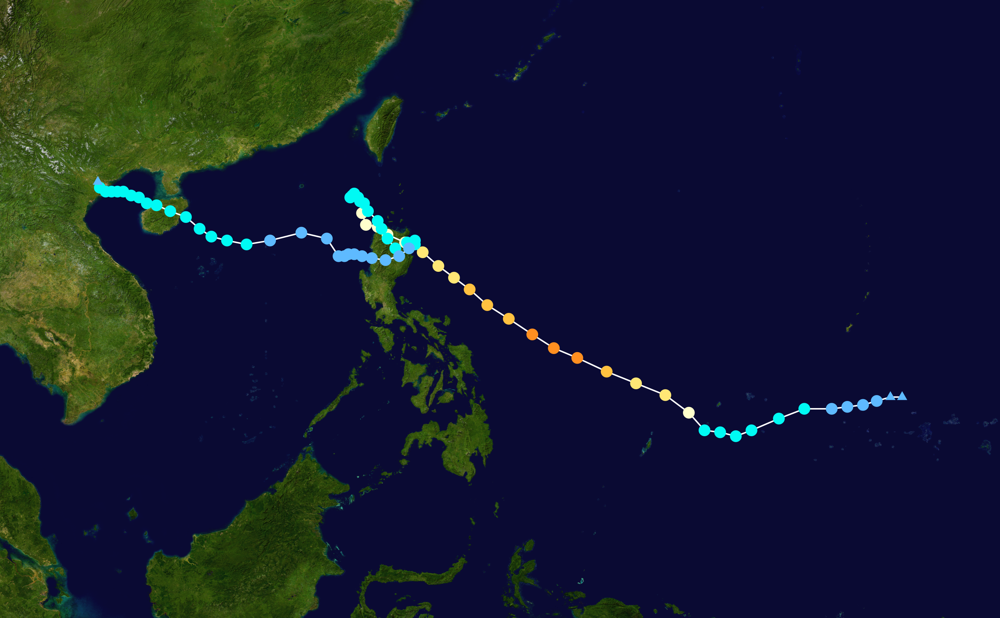

# **Result: Maximum Rainfall per TC Event in Philippines from 2000 to 2025**

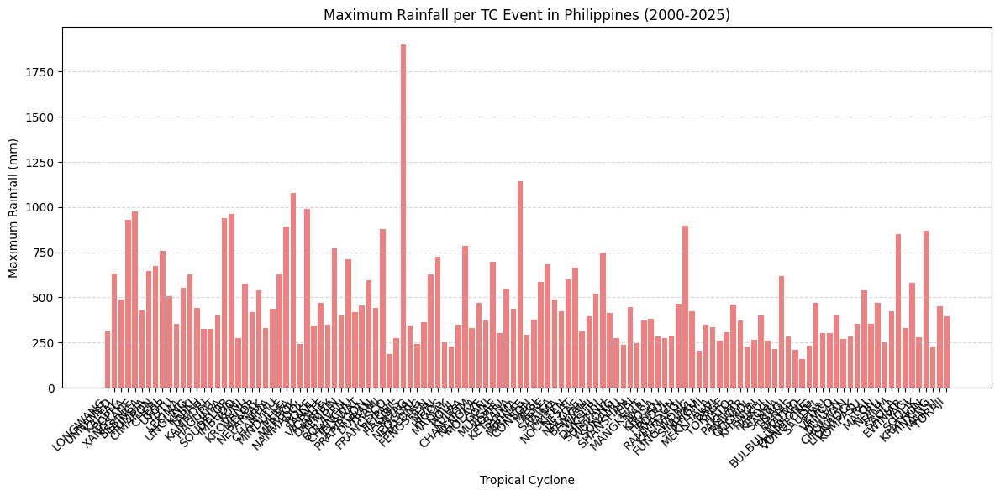

Maximum Rainfall caused by TC Event in Philippines in an hour: 2007323N09128	HAGIBIS 1901mm

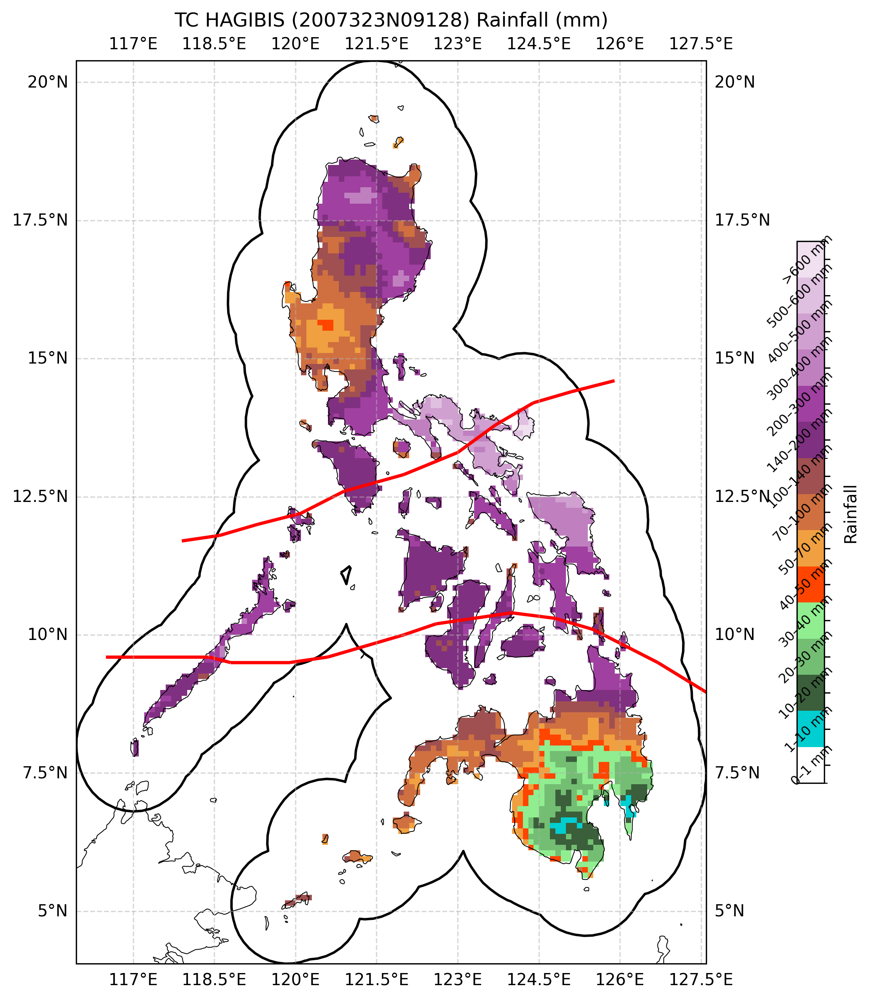

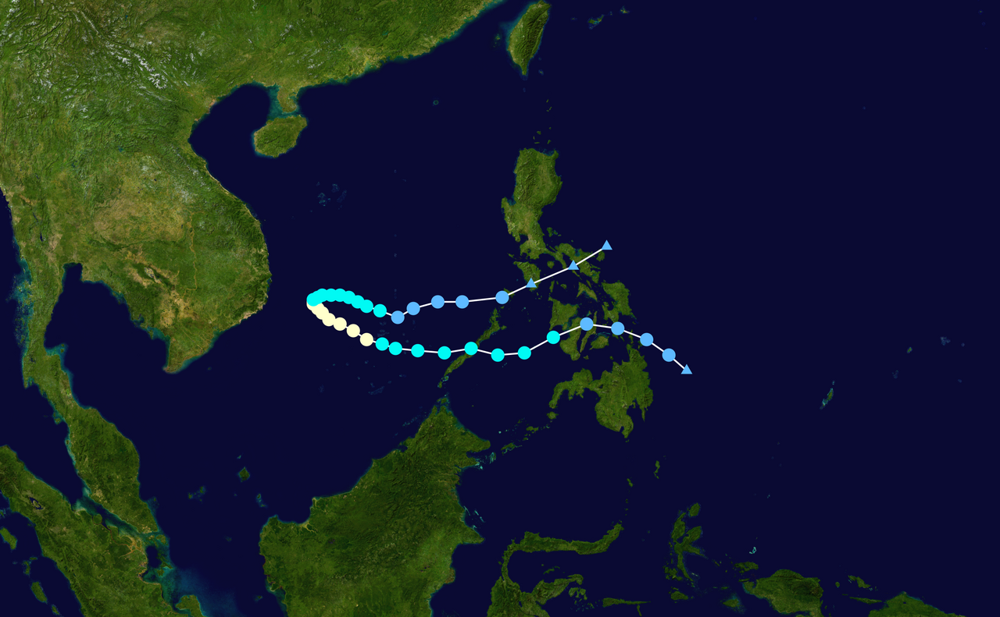

# **FunFact and Reference**

Rainfall Label Reference:

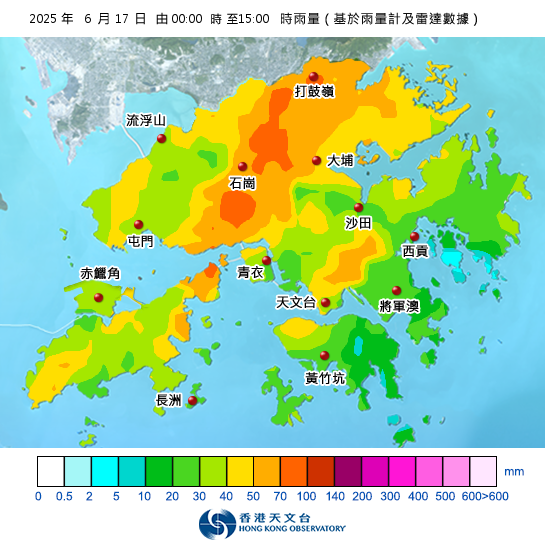

Yagi, passing through the Philippines as a tropical storm on September 1, but combined with the effects of the southwest monsoon, it caused flooding in Metro Manila, and in the provinces of Bulacan, Camarines Norte, Camarines Sur, Cavite, Laguna, Northern Samar, Pangasinan, and Rizal.

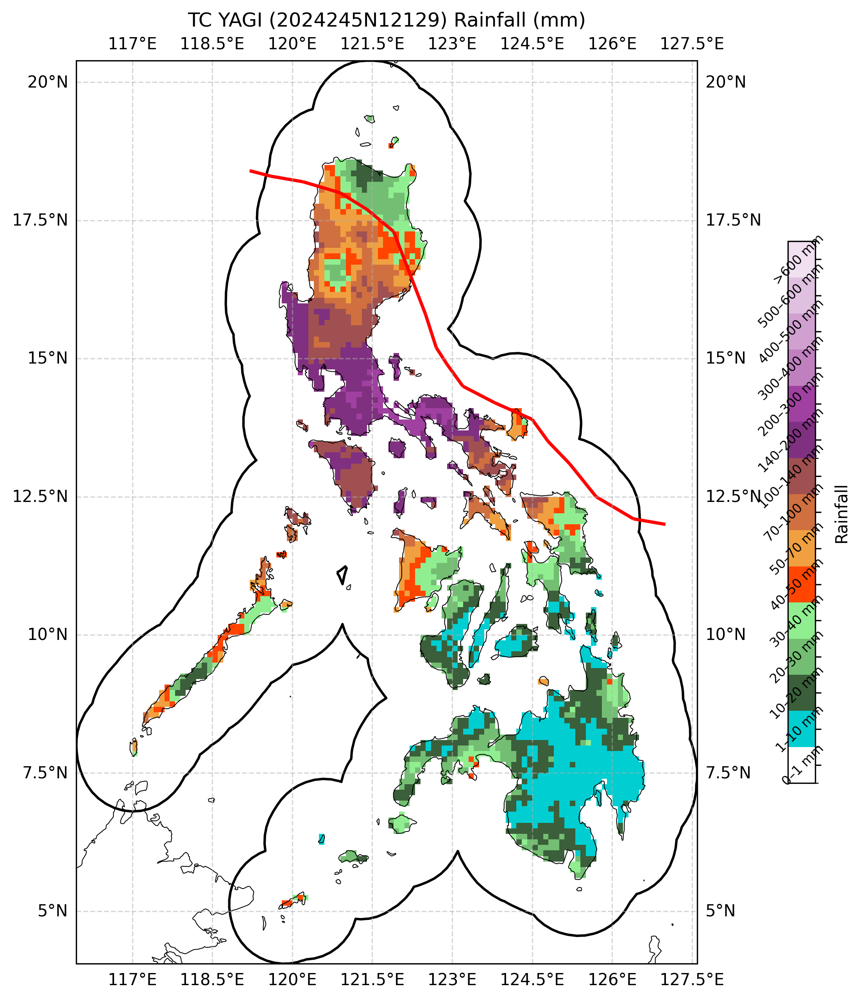

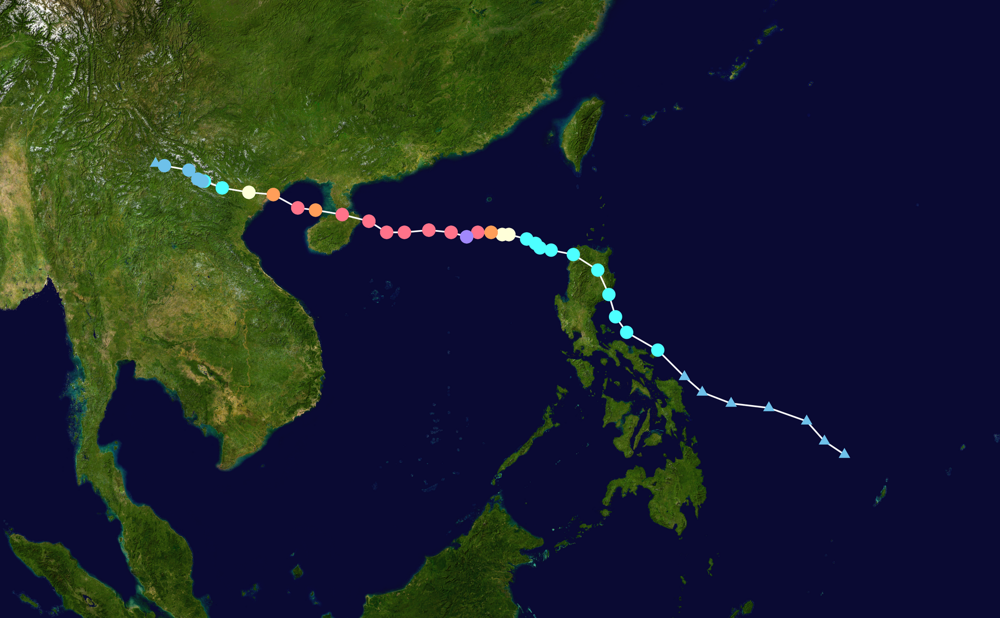

Philippines Map

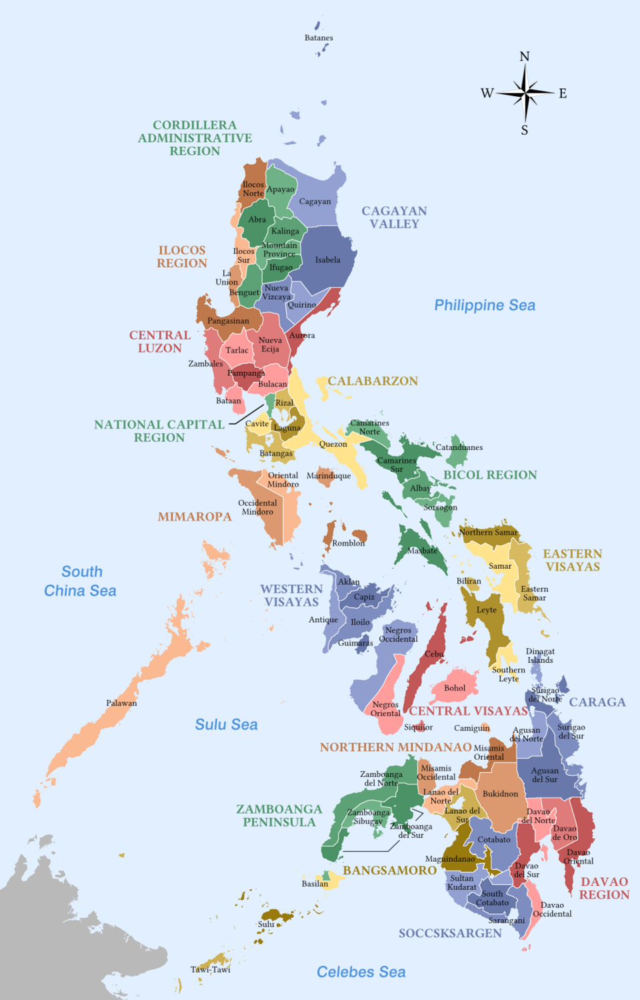

https://agora.ex.nii.ac.jp/digital-typhoon/ibtracs/WP/index.html.en
